In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import time
import matplotlib
import matplotlib.pyplot as plt
import lsst.meas.base
import lsst.pex.config
import lsst.afw.display as afwDisplay
import lsst.afw.geom as afwGeom
import lsst.afw.table
import lsst.meas.algorithms
import lsst.meas.deblender
import lsst.pex.exceptions
import lsst.meas.extensions.gaap

from kuaizi.display import display_single
from astropy.io import fits
from astropy.table import Table, hstack
import matplotlib.patches as patches

In [2]:
import sys
sys.path.append('/home/jiaxuanl/Research/Merian/lambo//scripts/')

In [3]:
import lsst.afw.table
import lsst.meas.algorithms
import lsst.meas.deblender
import lsst.pex.exceptions
import lsst.meas.extensions.gaap

from kuaizi.display import display_single
from astropy.io import fits
from astropy.table import Table, hstack

## Some questions
1. Why Merian has so many detections?
2. Can we run PSF flux?
3. Is there flux variations between patches?

In [132]:
# Load Merian catalog as reference
filt = 'N708'
tract = 9813
patch = 61 #68
patch_old = f'{patch % 9},{patch // 9}'

import lsst.daf.butler as dafButler
butler = dafButler.Butler('/projects/MERIAN/repo/')
dataId = dict(tract=tract, patch=patch, band=filt)

refCat_N708 = butler.get(
    'deepCoadd_ref',
    collections='DECam/runs/merian/dr1_wide',
    dataId=dataId,
    instrument='DECam',
    skymap='hsc_rings_v1',
)

refExposure_N708 = butler.get(
    'deepCoadd_calexp',
    collections='DECam/runs/merian/dr1_wide',
    dataId=dataId,
    instrument='DECam',
    skymap='hsc_rings_v1',
)

In [133]:
# Load Merian catalog as reference
filt = 'N540'
tract = 9813
patch = 61 #68
patch_old = f'{patch % 9},{patch // 9}'

import lsst.daf.butler as dafButler
butler = dafButler.Butler('/projects/MERIAN/repo/')
dataId = dict(tract=tract, patch=patch, band=filt)

refCat_N540 = butler.get(
    'deepCoadd_ref',
    collections='DECam/runs/merian/dr1_wide',
    dataId=dataId,
    instrument='DECam',
    skymap='hsc_rings_v1',
)

refExposure_N540 = butler.get(
    'deepCoadd_calexp',
    collections='DECam/runs/merian/dr1_wide',
    dataId=dataId,
    instrument='DECam',
    skymap='hsc_rings_v1',
)

In [134]:
hsc_type = 'S20A'
if hsc_type == 'w40':
    exposure = lsst.afw.image.ExposureF(
        f'/scratch/arunj/deepCoadd_calexp_9813_{patch}_i_hsc_rings_v1_HSC_runs_RC2_w_2022_40_DM-36356_20221006T193226Z.fits'
    )
elif hsc_type == 'w04':
    exposure = lsst.afw.image.ExposureF(
        f"/projects/MERIAN/repo/HSC/runs/RC2/w_2022_04/DM-33402/20220128T212035Z/deepCoadd_calexp/9813/{patch}/i/deepCoadd_calexp_9813_{patch}_i_hsc_rings_v1_HSC_runs_RC2_w_2022_04_DM-33402_20220128T212035Z.fits"
    )
elif hsc_type == 'S20A':
    exposure = lsst.afw.image.ExposureF(
        f"/projects/MERIAN/repo/S20A/deepCoadd_calexp/{tract}/{patch_old}/calexp-HSC-I-{tract}-{patch_old}.fits"
    )
    
from hsc_gaap.gaap import checkWcsEqual
if checkWcsEqual(exposure.getWcs(), refExposure.getWcs()):
    exposure.setWcs(refExposure.getWcs())

rsync -zva --progress jiaxuanl@tiger.princeton.edu://projects/MERIAN/repo/S20A/deepCoadd_calexp/9813/5,3/calexp-HSC-I-9813-5,3.fits ./

In [5]:
# exposure.mask.clearMaskPlane(exposure.mask.getMaskPlane('NO_DATA'))
# exposure.mask.clearMaskPlane(exposure.mask.getMaskPlane('INTRP'))

In [136]:
cat = refCat_N708.asAstropy()
cat['coord_ra'] = np.rad2deg(cat['coord_ra'])
cat['coord_dec'] = np.rad2deg(cat['coord_dec'])
print(len(cat))

32607


In [137]:
cat = refCat_N540.asAstropy()
cat['coord_ra'] = np.rad2deg(cat['coord_ra'])
cat['coord_dec'] = np.rad2deg(cat['coord_dec'])
print(len(cat))

32607


In [138]:
bbox = refExposure_N708.getBBox()
ori = refExposure_N708.wcs.pixelToSky(*bbox.getBegin())
ori = (ori.getRa().asDegrees(), ori.getDec().asDegrees())
end = refExposure_N708.wcs.pixelToSky(*bbox.getEnd())
end = (end.getRa().asDegrees(), end.getDec().asDegrees())

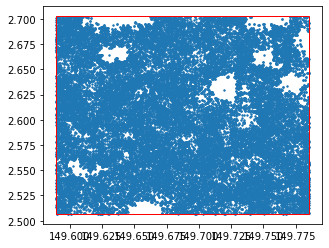

In [139]:
fig, ax = plt.subplots(figsize=(5, 4))
plt.scatter(cat['coord_ra'], cat['coord_dec'], s=2)
rect = patches.Rectangle(ori, end[0]-ori[0], end[1]-ori[1], linewidth=1, edgecolor='r', facecolor='none')
ax.add_patch(rect)

In [140]:
bbox

Box2I(corner=Point2I(27900, 23900), dimensions=Extent2I(4200, 4200))

(26509.0, 27010.0)

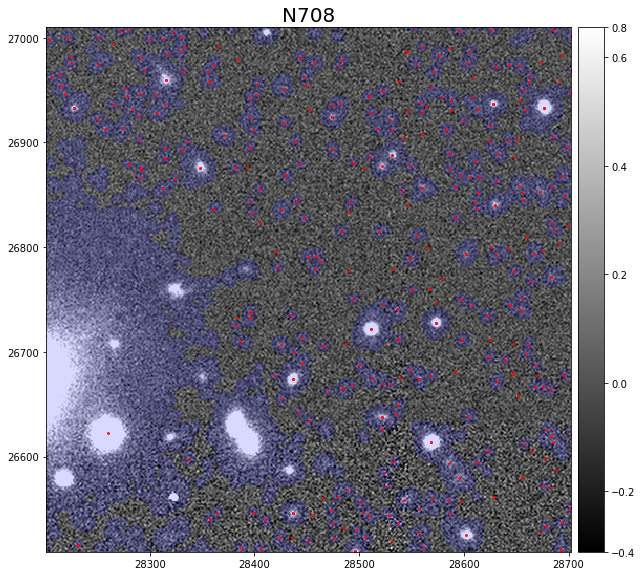

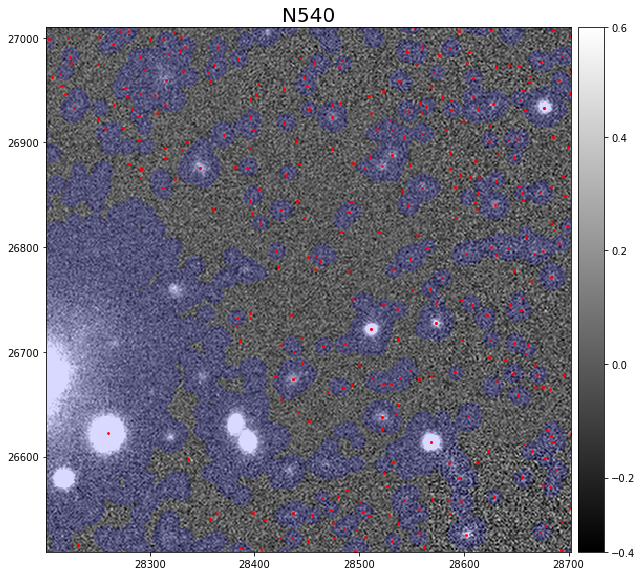

In [141]:
import lsst.geom as geom
import lsst.afw.display as afwDisplay

pix = geom.Point2I((28451, 26759.2))
# Define a bounding box for the cutout region
bbox = geom.Box2I(pix, pix)
bbox.grow(250)

cutout = refExposure_N708[bbox]
afwDisplay.setDefaultBackend('matplotlib')
fig, ax = plt.subplots(figsize=(10, 10))
display = afwDisplay.Display(frame=fig)
display.scale("linear", "zscale")
for key in display.getMaskPlaneColor().keys():
    display.setMaskPlaneColor(key, 'IGNORE')
display.setMaskPlaneColor('NO_DATA', 'cyan')
display.setMaskPlaneColor('DETECTED', 'blue')
display.setMaskTransparency(85)
display.mtv(cutout)
plt.title('N708', fontsize=20)
plt.scatter(cat['base_SdssCentroid_x'], cat['base_SdssCentroid_y'], s=3, color='r')
plt.xlim(28201, 28201 + 501)
plt.ylim(26509, 26509 + 501)

cutout = refExposure_N540[bbox]
afwDisplay.setDefaultBackend('matplotlib')
fig, ax = plt.subplots(figsize=(10, 10))
display = afwDisplay.Display(frame=fig)
display.scale("linear", "zscale")
for key in display.getMaskPlaneColor().keys():
    display.setMaskPlaneColor(key, 'IGNORE')
display.setMaskPlaneColor('NO_DATA', 'cyan')
display.setMaskPlaneColor('DETECTED', 'blue')
display.setMaskTransparency(85)
display.mtv(cutout)
plt.title('N540', fontsize=20)
plt.scatter(cat['base_SdssCentroid_x'], cat['base_SdssCentroid_y'], s=3, color='r')
plt.xlim(28201, 28201 + 501)
plt.ylim(26509, 26509 + 501)

(26509.0, 27010.0)

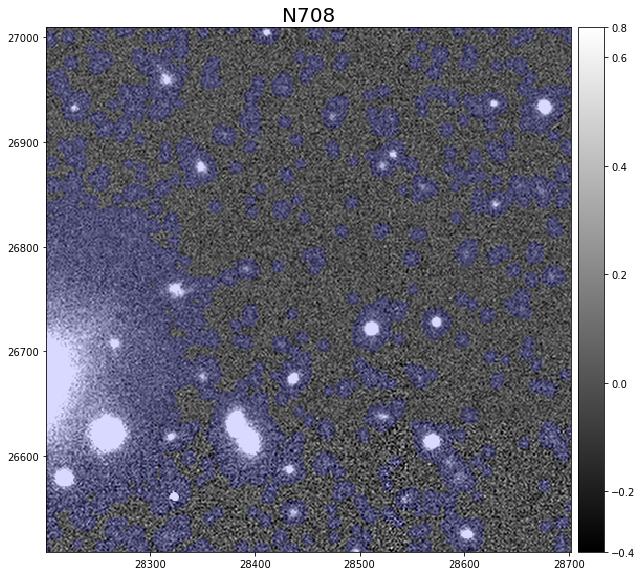

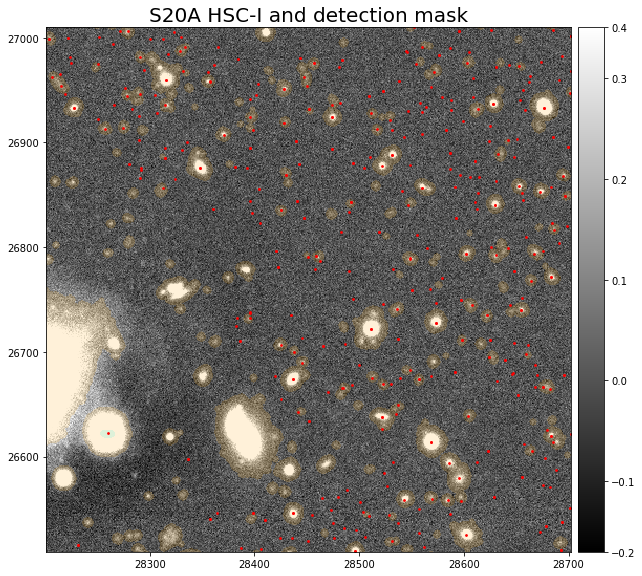

In [144]:
import lsst.geom as geom
import lsst.afw.display as afwDisplay

pix = geom.Point2I((28451, 26759.2))
# Define a bounding box for the cutout region
bbox = geom.Box2I(pix, pix)
bbox.grow(250)

cutout = refExposure_N708[bbox]
afwDisplay.setDefaultBackend('matplotlib')
fig, ax = plt.subplots(figsize=(10, 10))
display = afwDisplay.Display(frame=fig)
display.scale("linear", "zscale")
for key in display.getMaskPlaneColor().keys():
    display.setMaskPlaneColor(key, 'IGNORE')
display.setMaskPlaneColor('NO_DATA', 'cyan')
display.setMaskPlaneColor('DETECTED', 'blue')
display.setMaskTransparency(85)
display.mtv(cutout)
plt.title('N708', fontsize=20)

cutout = exposure[bbox]
afwDisplay.setDefaultBackend('matplotlib')
fig, ax = plt.subplots(figsize=(10, 10))
display = afwDisplay.Display(frame=fig)
display.scale("linear", "zscale")
for key in display.getMaskPlaneColor().keys():
    display.setMaskPlaneColor(key, 'IGNORE')
display.setMaskPlaneColor('NO_DATA', 'cyan')
display.setMaskPlaneColor('DETECTED', 'orange')
display.setMaskTransparency(85)
display.mtv(cutout)
plt.title('S20A HSC-I and detection mask', fontsize=20)
plt.scatter(cat['base_SdssCentroid_x'], cat['base_SdssCentroid_y'], s=3, color='r')
plt.xlim(28201, 28201 + 501)
plt.ylim(26509, 26509 + 501)

Text(0.5, 1.0, 'S20A HSC-I, but Merian detection mask')

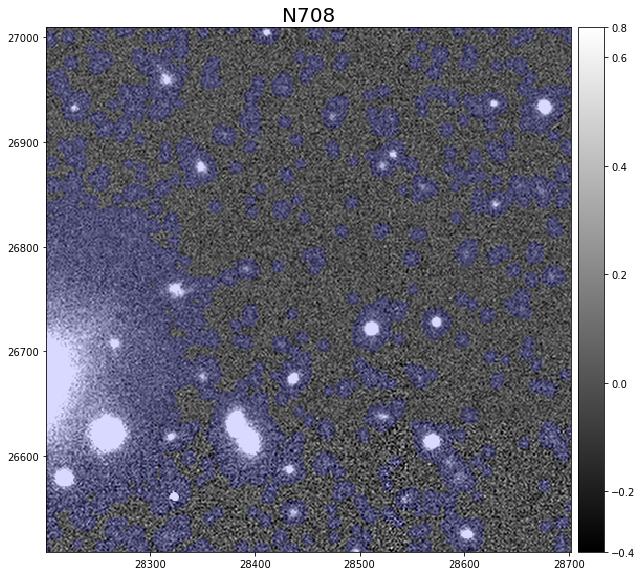

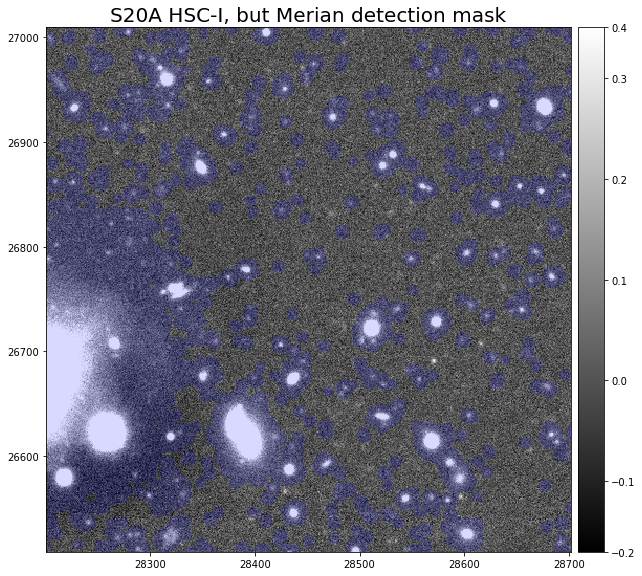

In [145]:
import lsst.geom as geom
import lsst.afw.display as afwDisplay

pix = geom.Point2I((28451, 26759.2))
# Define a bounding box for the cutout region
bbox = geom.Box2I(pix, pix)
bbox.grow(250)

cutout = refExposure_N708[bbox]
afwDisplay.setDefaultBackend('matplotlib')
fig, ax = plt.subplots(figsize=(10, 10))
display = afwDisplay.Display(frame=fig)
display.scale("linear", "zscale")
for key in display.getMaskPlaneColor().keys():
    display.setMaskPlaneColor(key, 'IGNORE')
display.setMaskPlaneColor('NO_DATA', 'cyan')
display.setMaskPlaneColor('DETECTED', 'blue')
display.setMaskTransparency(85)
display.mtv(cutout)
plt.title('N708', fontsize=20)

temp = exposure.clone()
temp.mask = refExposure_N708.mask
cutout = temp[bbox]
afwDisplay.setDefaultBackend('matplotlib')
fig, ax = plt.subplots(figsize=(10, 10))
display = afwDisplay.Display(frame=fig)
display.scale("linear", "zscale")
for key in display.getMaskPlaneColor().keys():
    display.setMaskPlaneColor(key, 'IGNORE')
display.setMaskPlaneColor('NO_DATA', 'cyan')
display.setMaskPlaneColor('DETECTED', 'blue')
display.setMaskTransparency(85)
display.mtv(cutout)
plt.title('S20A HSC-I, but Merian detection mask', fontsize=20)

### Overlaps between patches

In [19]:
import lsst.daf.butler as dafButler
import lsst.geom as geom
butler = dafButler.Butler('/projects/MERIAN/repo/')

In [20]:
skymap = butler.get('skyMap', collections='DECam/runs/merian/dr1_wide', skymap='hsc_rings_v1')

In [28]:
coord = [geom.SpherePoint(151.0 * geom.degrees, 1.45 * geom.degrees)]

In [29]:
for i in skymap.findTractPatchList(coord):
    print(i)
    print('\n')

(TractInfo(id=9571, ctrCoord=[-0.8754844548181194, 0.483071891154491, 0.012981423197931035]), (PatchInfo(index=Index2D(x=5, y=8), innerBBox=(minimum=(20000, 32000), maximum=(23999, 35999)), outerBBox=(minimum=(19900, 31900), maximum=(24099, 35999))),))


(TractInfo(id=9813, ctrCoord=[-0.8675226003689683, 0.4958715188358974, 0.03893551921373768]), (PatchInfo(index=Index2D(x=0, y=0), innerBBox=(minimum=(0, 0), maximum=(3999, 3999)), outerBBox=(minimum=(0, 0), maximum=(4099, 4099))),))


(TractInfo(id=9814, ctrCoord=[-0.8801033664165095, 0.47318293477880596, 0.03893551921373768]), (PatchInfo(index=Index2D(x=8, y=0), innerBBox=(minimum=(32000, 0), maximum=(35999, 3999)), outerBBox=(minimum=(31900, 0), maximum=(35999, 4099))),))




In [105]:
# Load Merian catalog as reference
refcats = {}
for filt in ['N708', 'N540']:
    refcats[filt] = []
    tract_patches = [[9814, 8], [9813, 0], [9571, 5+8*9]]
    for item in tract_patches:
        tract, patch = item
        patch_old = f'{patch % 9},{patch // 9}'
        dataId = dict(tract=tract, patch=patch, band=filt)
        
        temp = butler.get(
            'deepCoadd_forced_src',
            collections='DECam/runs/merian/dr1_wide',
            dataId=dataId,
            instrument='DECam',
            skymap='hsc_rings_v1',
        )
        refcats[filt].append(temp)
        
        photoCalib = butler.get(
            'deepCoadd_calexp.photoCalib',
            dataId = dataId,
            collections='DECam/runs/merian/dr1_wide',
            skymap = 'hsc_rings_v1',
            instrument = 'DECam',
        )
        conv_njy = photoCalib.instFluxToNanojansky(1)
        print(f'Loading filt = {filt}, tract = {tract}, patch = {patch}, conv_njy = {conv_njy}')

Loading filt = N708, tract = 9814, patch = 8, conv_njy = 57.543993733715425
Loading filt = N708, tract = 9813, patch = 0, conv_njy = 57.543993733715425
Loading filt = N708, tract = 9571, patch = 77, conv_njy = 57.543993733715425
Loading filt = N540, tract = 9814, patch = 8, conv_njy = 57.543993733715425
Loading filt = N540, tract = 9813, patch = 0, conv_njy = 57.543993733715425
Loading filt = N540, tract = 9571, patch = 77, conv_njy = 57.543993733715425


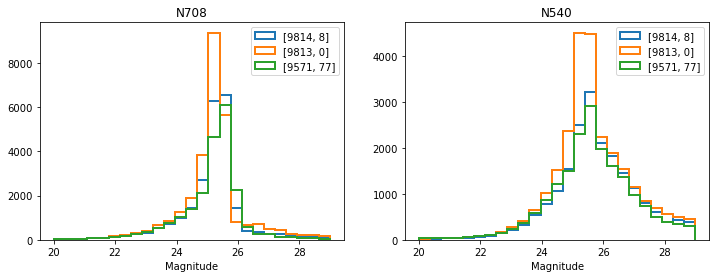

In [124]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
for j, filt in enumerate(['N708', 'N540']):
    plt.sca(axes[j])
    for i, cat in enumerate(refcats[filt]):
        mags = 31 - 2.5 * np.log10(cat['base_PsfFlux_instFlux'] * conv_njy)
        plt.hist(mags, bins=25, range=(20, 29), histtype='step', lw=2, label=str(tract_patches[i]))
        plt.title(filt)
        plt.xlabel('Magnitude')
        plt.legend()

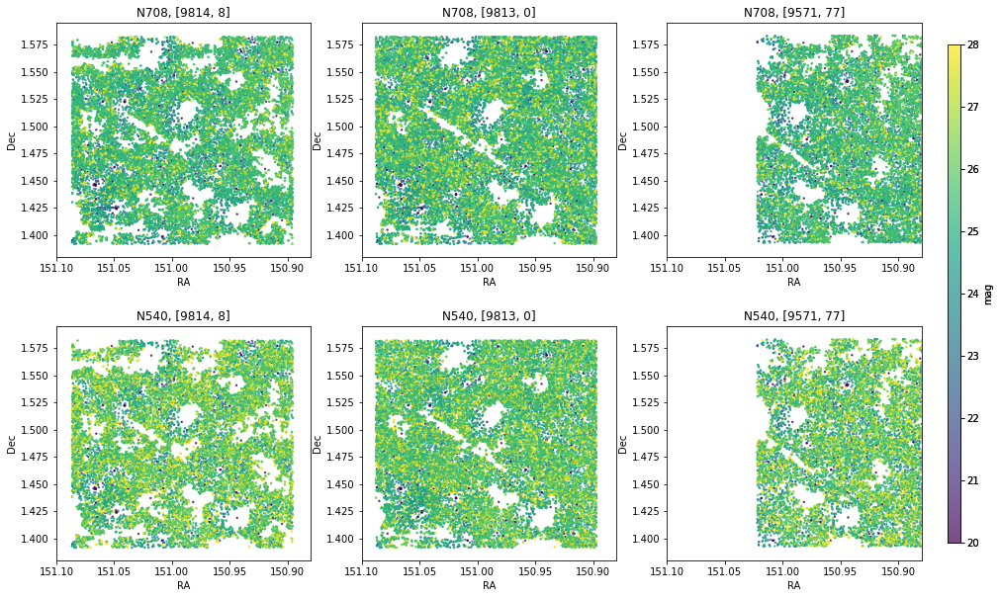

In [123]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

for j, filt in enumerate(['N708', 'N540']):
    for i, cat in enumerate(refcats[filt]):
        plt.sca(axes[j][i])
        
        mags = 31 - 2.5 * np.log10(cat['base_PsfFlux_instFlux'] * conv_njy)
        plt.scatter(np.rad2deg(cat['coord_ra']), np.rad2deg(cat['coord_dec']), 
                    c=mags, s=2, alpha=0.7, vmin=20, vmax=28)
        plt.title(filt + ', ' + str(tract_patches[i]))
        plt.xlim(151.10, 150.88)
        plt.ylim(1.380, 1.595)
        plt.xlabel('RA')
        plt.ylabel('Dec')
        
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.82, 0.15, 0.01, 0.7])
    plt.colorbar(cax=cbar_ax, label='mag')
    
plt.subplots_adjust(hspace=0.3, wspace=0.2)

butler query-datasets /projects/MERIAN/repo/ --collections DECam/runs/merian/dr1_wide --where "instrument='DECam' AND skymap='hsc_rings_v1' AND tract=9813 AND patch=0" objectTable_patch

In [176]:
import lsst.daf.butler as dafButler
butler = dafButler.Butler('/projects/MERIAN/repo/')

In [ ]:
ras = []
decs = []
mags = []
flags = []

# Load Merian catalog as reference
filt = 'N708'
conv_njy = 57.543993733715425

for patch in range(0, 81):
    tract = 9813
    # patch = 8 #68
    patch_old = f'{patch % 9},{patch // 9}'
    dataId = dict(tract=tract, patch=patch, band=filt)
    try:
        refCat = butler.get(
            'deepCoadd_ref',
            collections='DECam/runs/merian/dr1_wide',
            dataId=dataId,
            instrument='DECam',
            skymap='hsc_rings_v1',
        )
        _mag = 31 - 2.5 * np.log10(refCat['base_PsfFlux_instFlux'] * conv_njy)
        flag = (~refCat['merge_peak_N540']) & (refCat['merge_peak_N708'])
        ras.append(np.rad2deg(refCat['coord_ra']))
        decs.append(np.rad2deg(refCat['coord_dec']))
        mags.append(_mag)
        flags.append(flag)
        print(f'Loading filt = {filt}, tract = {tract}, patch = {patch}')
#         # not detected in N540 but detected in N708
#         plt.scatter(np.rad2deg(refCat['coord_ra'])[flag], np.rad2deg(refCat['coord_dec'])[flag], 
#                     c=mags[flag], 
#                     s=2, alpha=0.7, vmin=20, vmax=28)
    except Exception as e:
        pass

Loading filt = N708, tract = 9813, patch = 0
Loading filt = N708, tract = 9813, patch = 1
Loading filt = N708, tract = 9813, patch = 2
Loading filt = N708, tract = 9813, patch = 4
Loading filt = N708, tract = 9813, patch = 5
Loading filt = N708, tract = 9813, patch = 6
Loading filt = N708, tract = 9813, patch = 7
Loading filt = N708, tract = 9813, patch = 8
Loading filt = N708, tract = 9813, patch = 9
Loading filt = N708, tract = 9813, patch = 10
Loading filt = N708, tract = 9813, patch = 11
Loading filt = N708, tract = 9813, patch = 12
Loading filt = N708, tract = 9813, patch = 13
Loading filt = N708, tract = 9813, patch = 14
Loading filt = N708, tract = 9813, patch = 15
Loading filt = N708, tract = 9813, patch = 16
Loading filt = N708, tract = 9813, patch = 17
Loading filt = N708, tract = 9813, patch = 18
Loading filt = N708, tract = 9813, patch = 19
Loading filt = N708, tract = 9813, patch = 20
Loading filt = N708, tract = 9813, patch = 21
Loading filt = N708, tract = 9813, patch = 

Text(0, 0.5, 'Dec')

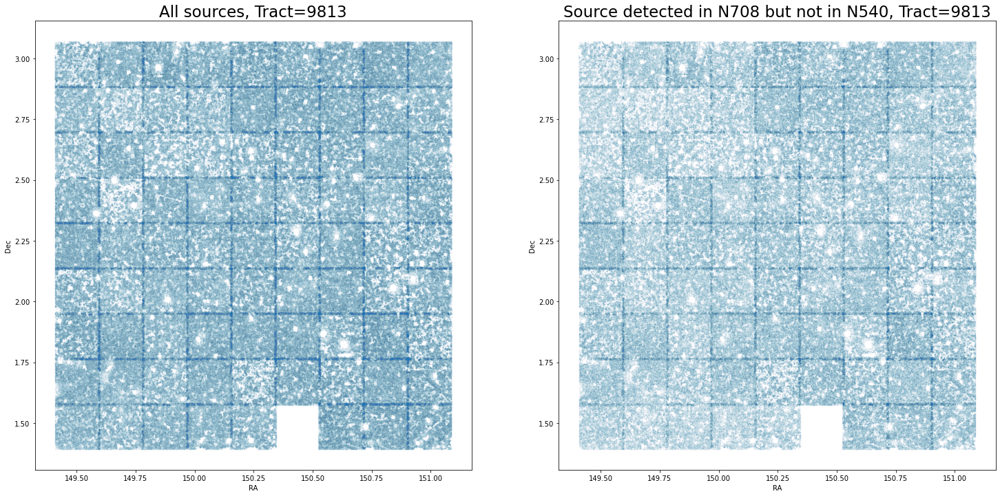

In [206]:
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(25, 12))
plt.sca(ax1)
for i in range(len(ras)):
    plt.scatter(ras[i], decs[i], s=1, color='C0', alpha=0.02)
# rect = patches.Rectangle(ori, end[0]-ori[0], end[1]-ori[1], linewidth=1, edgecolor='r', facecolor='none')
# ax.add_patch(rect)
plt.title('All sources, Tract=9813', fontsize=23)
plt.xlabel('RA')
plt.ylabel('Dec')

plt.sca(ax2)
for i in range(len(ras)):
    plt.scatter(ras[i][flags[i]], decs[i][flags[i]], s=1, color='C0', alpha=0.02)

plt.title('Source detected in N708 but not in N540, Tract=9813', fontsize=23)
plt.xlabel('RA')
plt.ylabel('Dec')

In [190]:
len(mags)

80

In [ ]:
refCat['merge_peak_N540']


plt.hist(31 - 2.5 * np.log10(refCat['base_PsfFlux_instFlux'] * 57), bins=25, range=(20, 29))
plt.hist(31 - 2.5 * np.log10(refCat['base_PsfFlux_instFlux'] * 57)[flag], bins=25, range=(20, 29))

---
### Object number density map

In [159]:
from astropy.table import vstack

In [174]:
for i, tract in enumerate([9814, 9813, 9812, 9569, 9570, 9571, 10056, 10055, 10054]):
    if i == 0:
        cat = Table.read(f'/scratch/gpfs/am2907/Merian/gaap/S20A/gaapTable/{tract}/objectTable_{tract}_S20A.fits')[['coord_ra', 'coord_dec']]
    else:
        cat = vstack([cat, 
                      Table.read(f'/scratch/gpfs/am2907/Merian/gaap/S20A/gaapTable/{tract}/objectTable_{tract}_S20A.fits')[['coord_ra', 'coord_dec']]])

In [175]:
len(cat)

20562261

In [178]:
font = {'size'   : 20}

matplotlib.rc('font', **font)

Text(0, 0.5, 'Dec')

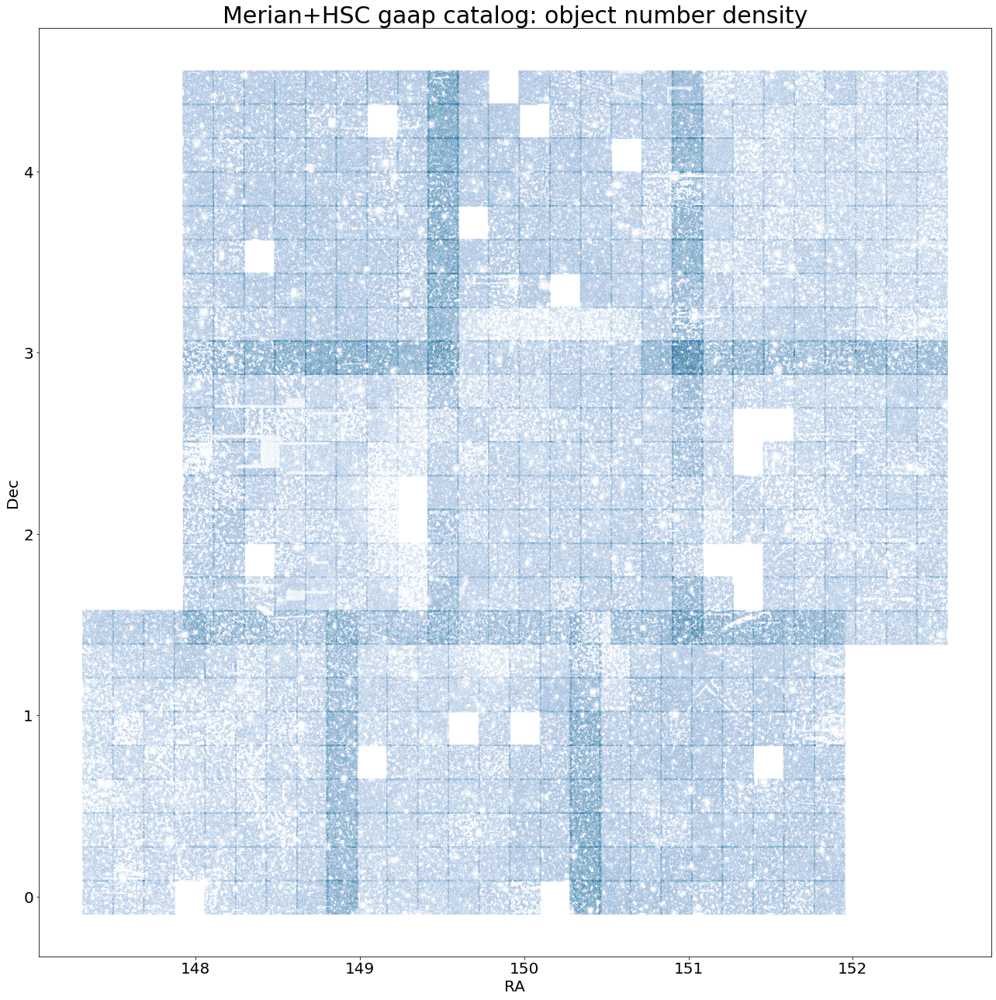

In [180]:
fig, ax = plt.subplots(figsize=(22, 22))
plt.scatter(cat['coord_ra'], cat['coord_dec'], s=0.1, alpha=0.016)
# rect = patches.Rectangle(ori, end[0]-ori[0], end[1]-ori[1], linewidth=1, edgecolor='r', facecolor='none')
# ax.add_patch(rect)
plt.title('Merian+HSC gaap catalog: object number density', fontsize=30)
plt.xlabel('RA')
plt.ylabel('Dec')

Text(0, 0.5, 'Dec')

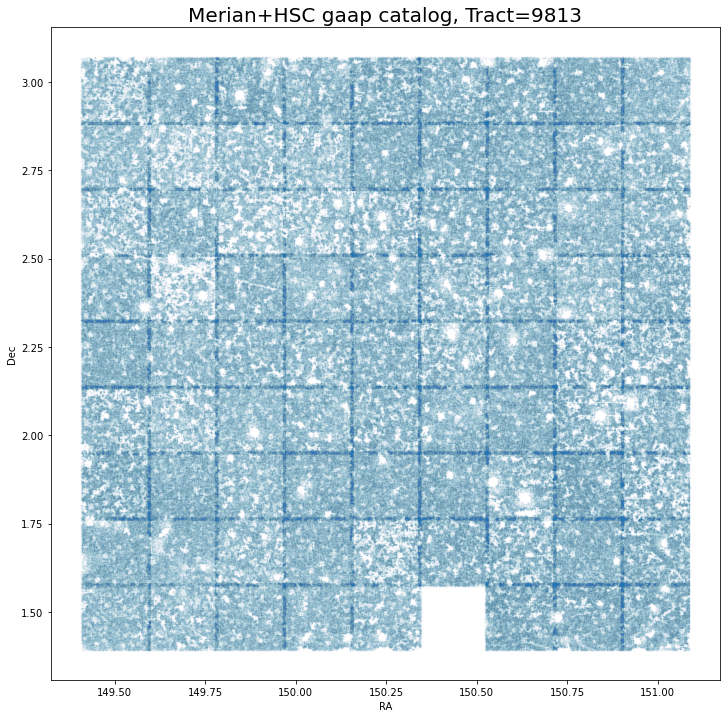

In [157]:
fig, ax = plt.subplots(figsize=(12, 12))
plt.scatter(cat['coord_ra'], cat['coord_dec'], s=1, alpha=0.02)
# rect = patches.Rectangle(ori, end[0]-ori[0], end[1]-ori[1], linewidth=1, edgecolor='r', facecolor='none')
# ax.add_patch(rect)
plt.title('Merian+HSC gaap catalog, Tract=9813', fontsize=20)
plt.xlabel('RA')
plt.ylabel('Dec')